## Creating an interactive my of community plan areas with high pedestrian injury/death

In [2]:
# data
import geopandas as gpd

# graphics
import matplotlib.pyplot as plt
import plotly.express as px

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [3]:
# import data
crash = gpd.read_file('Ped_KSIs_by_CPA.zip')

In [4]:
# checking data to find columns i need
crash.info(verbose=True, null_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 37 entries, 0 to 36
Data columns (total 120 columns):
 #    Column      Non-Null Count  Dtype   
---   ------      --------------  -----   
 0    OBJECTID_1  37 non-null     int64   
 1    CPA_NUM     37 non-null     int64   
 2    NAME_ALF    37 non-null     object  
 3    CASE_ID     37 non-null     object  
 4    ACCIDENT_Y  37 non-null     int64   
 5    PROCDATE    37 non-null     int64   
 6    JURIS       37 non-null     int64   
 7    COLLISION_  37 non-null     int64   
 8    COLLISIO_1  37 non-null     int64   
 9    OFFICER_ID  37 non-null     object  
 10   REPORTING_  37 non-null     object  
 11   DAY_OF_WEE  37 non-null     object  
 12   SHIFT       37 non-null     object  
 13   POPULATION  37 non-null     object  
 14   CNTY_CITY_  37 non-null     object  
 15   SPECIAL_CO  37 non-null     object  
 16   BEAT_TYPE   37 non-null     object  
 17   CHP_BEAT_T  37 non-null     object  
 18   CITY_DIVIS  36 non-nul

/tmp/ipykernel_1579/2714541227.py:2: FutureWarning: null_counts is deprecated. Use show_counts instead
  crash.info(verbose=True, null_counts=True)


In [5]:
# subsetting data
sub = ['NAME_ALF', 'MilesofHIN', 'geometry']

In [6]:
crash[sub]

,NAME_ALF,MilesofHIN,geometry
0,Hollywood,31.730632,"POLYGON ((-118.30296 34.15854, -118.29884 34.1..."
1,Canoga Park - Winnetka - Woodland Hills - West...,16.471004,"POLYGON ((-118.62900 34.14728, -118.62899 34.1..."
2,Central City North,3.478841,"POLYGON ((-118.22540 34.07193, -118.22539 34.0..."
3,Chatsworth - Porter Ranch,2.735820,"POLYGON ((-118.57016 34.29536, -118.56872 34.2..."
4,Bel Air - Beverly Crest,0.000000,"POLYGON ((-118.46661 34.07280, -118.46670 34.0..."
5,Harbor Gateway,0.298722,"POLYGON ((-118.29851 33.81321, -118.30892 33.8..."
6,Westlake,15.805587,"POLYGON ((-118.27977 34.03789, -118.28411 34.0..."
7,Northridge,7.005908,"POLYGON ((-118.52810 34.27459, -118.52810 34.2..."
8,Port of Los Angeles,0.015306,"MULTIPOLYGON (((-118.23911 33.78008, -118.2414..."
9,Brentwood - Pacific Palisades,4.314443,"POLYGON ((-118.59922 34.07434, -118.57751 34.1..."


(-118.69382947728235,
 -118.12972901076266,
 33.671972853206235,
 34.36899380431766)

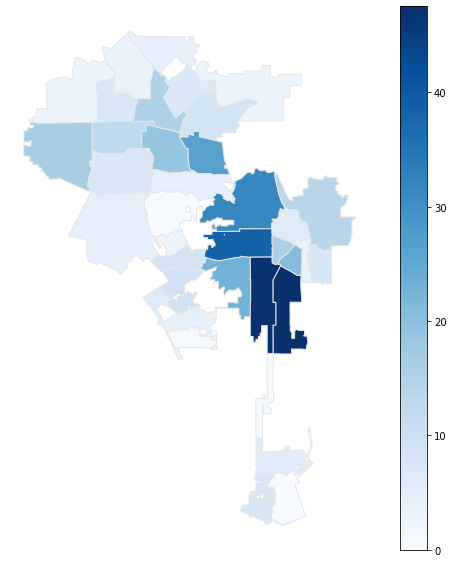

In [7]:
# choropleth of community plan areas dangerous for pedestrians and cyclists
fig, ax = plt.subplots(1, figsize=(10,10))
crash[sub].plot(
    column='MilesofHIN',
    cmap='Blues',
    linewidth=1,
    ax=ax,
    edgecolor='0.9',
    legend = True)
ax.axis('off')

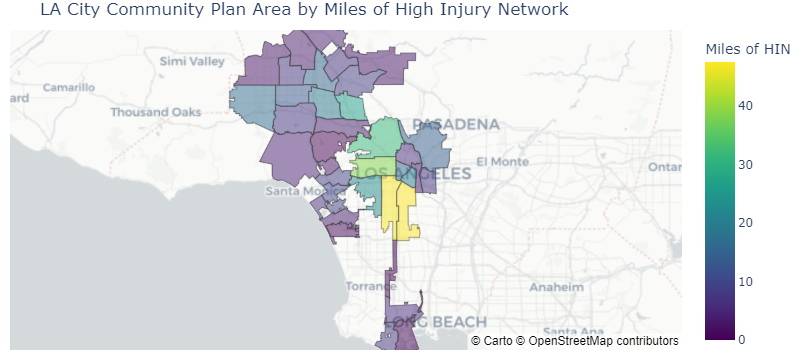

In [8]:
# interactive choropleth map
fig = px.choropleth_mapbox(crash[sub], # df
                           geojson=crash[sub].geometry, # cpa shapes
                           locations=crash[sub].index, # crash locations
                           color='MilesofHIN',
                           color_continuous_scale="Viridis",
                           mapbox_style="carto-positron", #basemap
                           zoom=8.25, center = {"lat": 34.01982530237761, "lon": -118.39964683456049},
                           opacity=0.5,
                           hover_data=['NAME_ALF'] # adding CPA name to hover tool
                          )
fig.update_layout(
    title_text='LA City Community Plan Area by Miles of High Injury Network'
)
fig.update_layout(
    margin={"r":0,"t":30,"l":10,"b":10},
    coloraxis_colorbar={
        'title':'Miles of HIN'})
fig.show()

<AxesSubplot:title={'center':'CPAs with Most High Injury Network Miles'}, xlabel='NAME_ALF'>

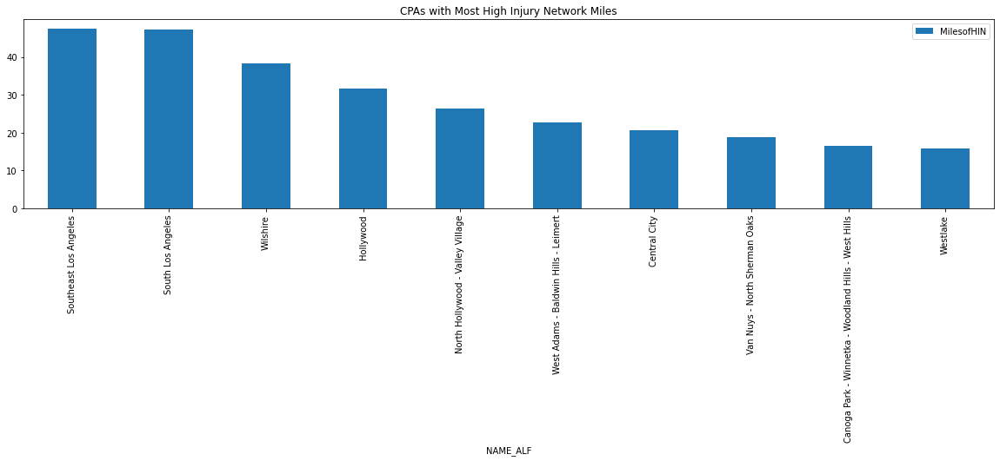

In [9]:
# make a bar chart of top 10 geographies with most Miles of HIN
crash_sorted = crash[sub].sort_values(by='MilesofHIN', ascending=False)
crash_sorted[:10].plot.bar(figsize=(20,4), x='NAME_ALF', y='MilesofHIN', title='CPAs with Most High Injury Network Miles')

In [10]:
fig.write_html("hinmap.html")